<a href="https://colab.research.google.com/github/eiphunter/awesome-wm/blob/master/test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


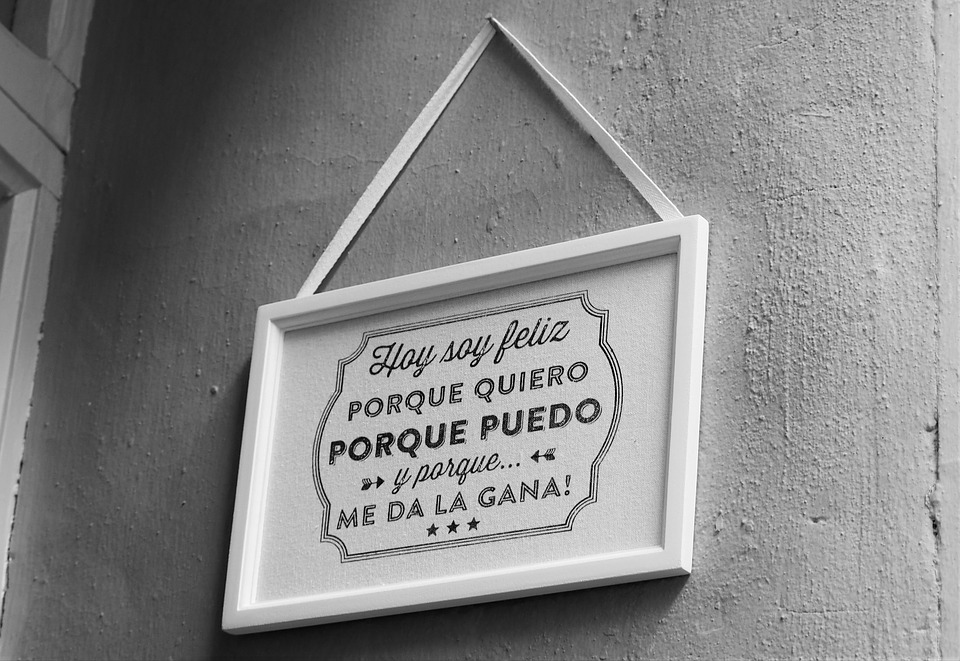

In [2]:
!pip install opencv-contrib-python==4.5.3.56
!sudo apt install tesseract-ocr
!pip install pytesseract

import cv2
import pytesseract
from google.colab.patches import cv2_imshow

image = cv2.imread('text2.jpg')
cv2_imshow(image)

In [3]:
text = pytesseract.image_to_string(image)
print(text)

In [4]:
!pip install plotly

import plotly.express as express

figure = express.imshow(image)
figure.show()

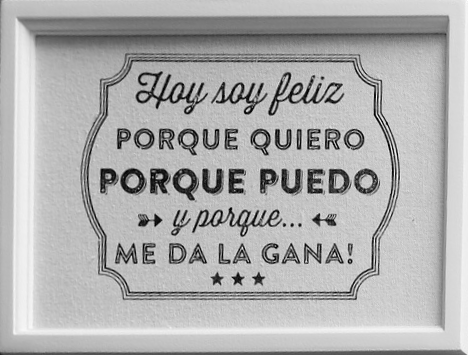

In [5]:
point1_topleft = [257, 307]
point2_bottomleft = [223, 631]
point3_bottomright = [688, 571]
point4_topright = [700, 216]

import numpy

input_points = numpy.float32([point1_topleft, point2_bottomleft, point3_bottomright, point4_topright])

height_1and2 = numpy.sqrt(((point1_topleft[0] - point2_bottomleft[0]) ** 2) + ((point1_topleft[1] - point2_bottomleft[1]) ** 2))

height_3and4 = numpy.sqrt(((point3_bottomright[0] - point4_topright[0]) ** 2) + ((point3_bottomright[1] - point4_topright[1]) ** 2))


max_height = max(int(height_1and2), int(height_3and4))


width_1and4 = numpy.sqrt(((point1_topleft[0] - point4_topright[0]) ** 2) + ((point1_topleft[1] - point4_topright[1]) ** 2))
width_2and3 = numpy.sqrt(((point2_bottomleft[0] - point3_bottomright[0]) ** 2) + ((point2_bottomleft[1] - point3_bottomright[1]) ** 2))

max_width = max(int(width_1and4), int(width_2and3))


output_points = numpy.float32([[0, 0 ], 
                               [0, max_height - 1], 
                               [max_width - 1, max_height - 1], 
                               [max_width - 1, 0]])

matrix = cv2.getPerspectiveTransform(input_points, output_points)

warped_photo = cv2.warpPerspective(image, matrix, (max_width, max_height), flags=cv2.INTER_LINEAR)

cv2_imshow(warped_photo)

In [6]:
text = pytesseract.image_to_string(warped_photo)
print(text)

In [7]:
!sudo apt-get install tesseract-ocr-spa

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  tesseract-ocr-spa
0 upgraded, 1 newly installed, 0 to remove and 37 not upgraded.
Need to get 951 kB of archives.
After this operation, 2,309 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-spa all 4.00~git24-0e00fe6-1.2 [951 kB]
Fetched 951 kB in 1s (932 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tesseract-ocr-spa.
(Reading database

In [9]:
text = pytesseract.image_to_string(warped_photo, lang="spa")
print(text)

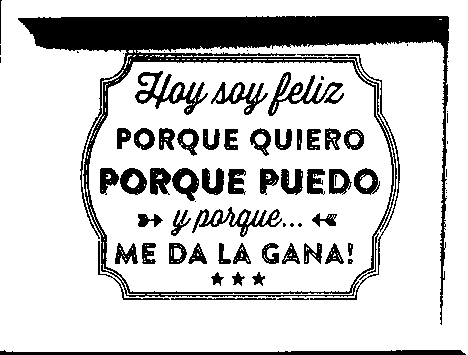

In [10]:
gray_warped_image = cv2.cvtColor(warped_photo, cv2.COLOR_BGR2GRAY)
threshold = cv2.threshold(gray_warped_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

cv2_imshow(threshold)

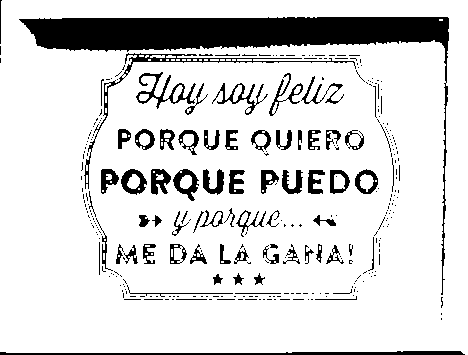

 

Í PORQUE QUIERO Y,
PORQUE PUEDO |

3» PNOMQUE...«x  /
[ME DA Lá Ganas |

Rm ;



In [17]:
import numpy

kernel = numpy.ones((2,2), numpy.uint8)

dilate = cv2.dilate(threshold, kernel, iterations = 1)
cv2_imshow(dilate)

text = pytesseract.image_to_string(dilate, lang="spa")
print(text)

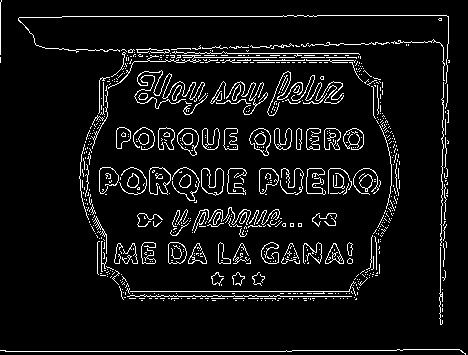

 
 
  
  
  
   

   

y

/ UV
paa

¡sonque IO



In [19]:
canny = cv2.Canny(threshold, 100, 200)
cv2_imshow(canny)
text = pytesseract.image_to_string(canny, lang="spa")
print(text)

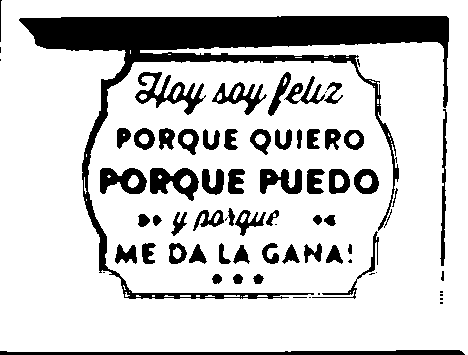

In [38]:
remove_noise = cv2.medianBlur(threshold, 5)
cv2_imshow(remove_noise)

In [39]:
text = pytesseract.image_to_string(remove_noise, lang="spa")
print(text)

 
   
    
     

   

Hoy soy feliz
PORQUE QUIERO
PORQUE PUEDO
e y ndique ..

ME DA LA GANA! j
co.

